In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [6]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 6

# for the filename
parameters = "2-0_5"

In [7]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)
    
# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))    

cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 29.8594012260437
My own part is done: 1.0604488849639893
Time for data preperation:  100.26989579200745


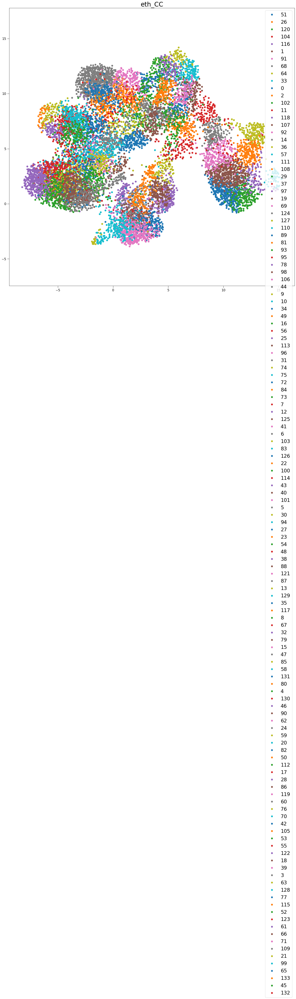

In [8]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [9]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [10]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/83 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/11 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/32 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/32 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/32 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/10 [00:00<?, ?it/s]

update Arr 32 -> 29
update Arr 29 -> 26
update Arr 26 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
update Arr 16 -> 13
update Arr 13 -> 11
update Arr 11 -> 10


calculating the densities for the density criterion:   0%|          | 0/481 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1836 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1836 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1836 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/480 [00:00<?, ?it/s]

update Arr 1836 -> 1669
added 7 edges early
update Arr 1669 -> 1443
added 4 edges early
update Arr 1443 -> 1311
added 4 edges early
update Arr 1311 -> 1173
added 9 edges early
update Arr 1173 -> 1066
update Arr 1066 -> 969
update Arr 969 -> 878
update Arr 878 -> 795
update Arr 795 -> 722
update Arr 722 -> 654
update Arr 654 -> 592
update Arr 592 -> 537
update Arr 537 -> 490
update Arr 490 -> 489
update Arr 489 -> 482
added 4 edges early
update Arr 482 -> 482
update Arr 482 -> 481
update Arr 481 -> 481


calculating the densities for the density criterion:   0%|          | 0/253 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/897 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/897 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/897 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/252 [00:00<?, ?it/s]

update Arr 897 -> 809
added 3 edges early
update Arr 809 -> 731
update Arr 731 -> 662
update Arr 662 -> 601
update Arr 601 -> 546
update Arr 546 -> 496
update Arr 496 -> 449
update Arr 449 -> 406
update Arr 406 -> 367
update Arr 367 -> 333
update Arr 333 -> 302
update Arr 302 -> 274
update Arr 274 -> 261
added 6 edges early
update Arr 261 -> 261
update Arr 261 -> 260
update Arr 260 -> 259
update Arr 259 -> 258
update Arr 258 -> 257
update Arr 257 -> 256
update Arr 256 -> 255
update Arr 255 -> 254


calculating the densities for the density criterion:   0%|          | 0/391 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1476 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1476 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1476 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/390 [00:00<?, ?it/s]

update Arr 1476 -> 1334
added 7 edges early
update Arr 1334 -> 1192
update Arr 1192 -> 1081
added 5 edges early
update Arr 1081 -> 975
added 3 edges early
update Arr 975 -> 886
update Arr 886 -> 805
update Arr 805 -> 731
update Arr 731 -> 663
update Arr 663 -> 601
update Arr 601 -> 546
update Arr 546 -> 496
update Arr 496 -> 450
update Arr 450 -> 409
update Arr 409 -> 395
added 7 edges early
update Arr 395 -> 395
update Arr 395 -> 394
update Arr 394 -> 393
update Arr 393 -> 392
update Arr 392 -> 392
update Arr 392 -> 391
update Arr 391 -> 391


calculating the densities for the density criterion:   0%|          | 0/120 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/430 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/430 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/430 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 430 -> 384
added 2 edges early
update Arr 384 -> 348
update Arr 348 -> 315
added 4 edges early
update Arr 315 -> 284
update Arr 284 -> 257
update Arr 257 -> 233
update Arr 233 -> 210
update Arr 210 -> 190
update Arr 190 -> 171
update Arr 171 -> 154
update Arr 154 -> 136
update Arr 136 -> 128
update Arr 128 -> 123
update Arr 123 -> 123
update Arr 123 -> 122
update Arr 122 -> 121
update Arr 121 -> 121
update Arr 121 -> 120


calculating the densities for the density criterion:   0%|          | 0/50 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/183 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/183 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/183 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 183 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 119
update Arr 119 -> 108
update Arr 108 -> 97
update Arr 97 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 61
update Arr 61 -> 56
update Arr 56 -> 55
update Arr 55 -> 54
update Arr 54 -> 52
update Arr 52 -> 51
update Arr 51 -> 51
update Arr 51 -> 50


calculating the densities for the density criterion:   0%|          | 0/83 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/294 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/294 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/294 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 294 -> 257
added 2 edges early
update Arr 257 -> 226
update Arr 226 -> 198
update Arr 198 -> 178
update Arr 178 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 119
update Arr 119 -> 105
update Arr 105 -> 89
update Arr 89 -> 89
update Arr 89 -> 88
update Arr 88 -> 87
update Arr 87 -> 87
update Arr 87 -> 85
update Arr 85 -> 84
update Arr 84 -> 83


calculating the densities for the density criterion:   0%|          | 0/205 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/755 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/755 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/755 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/204 [00:00<?, ?it/s]

update Arr 755 -> 683
added 2 edges early
update Arr 683 -> 618
update Arr 618 -> 560
update Arr 560 -> 508
update Arr 508 -> 461
update Arr 461 -> 417
update Arr 417 -> 379
update Arr 379 -> 344
update Arr 344 -> 312
update Arr 312 -> 281
update Arr 281 -> 254
update Arr 254 -> 230
update Arr 230 -> 214
update Arr 214 -> 213
update Arr 213 -> 212
update Arr 212 -> 211
update Arr 211 -> 210
update Arr 210 -> 209
update Arr 209 -> 208
update Arr 208 -> 207
update Arr 207 -> 206
update Arr 206 -> 205


calculating the densities for the density criterion:   0%|          | 0/130 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/471 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/471 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/471 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/129 [00:00<?, ?it/s]

update Arr 471 -> 417
added 3 edges early
update Arr 417 -> 376
update Arr 376 -> 338
update Arr 338 -> 307
update Arr 307 -> 279
update Arr 279 -> 253
update Arr 253 -> 229
update Arr 229 -> 206
update Arr 206 -> 186
update Arr 186 -> 169
update Arr 169 -> 153
update Arr 153 -> 139
update Arr 139 -> 138
update Arr 138 -> 134
update Arr 134 -> 134
update Arr 134 -> 133
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 130


calculating the densities for the density criterion:   0%|          | 0/22 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/74 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/74 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/74 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/21 [00:00<?, ?it/s]

update Arr 74 -> 67
update Arr 67 -> 56
update Arr 56 -> 49
update Arr 49 -> 44
update Arr 44 -> 35
update Arr 35 -> 31
update Arr 31 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 23
update Arr 23 -> 23
update Arr 23 -> 22


calculating the densities for the density criterion:   0%|          | 0/23 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/79 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/79 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/79 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 79 -> 71
update Arr 71 -> 62
update Arr 62 -> 54
update Arr 54 -> 49
update Arr 49 -> 44
update Arr 44 -> 37
update Arr 37 -> 32
update Arr 32 -> 26
update Arr 26 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
update Arr 24 -> 24


calculating the densities for the density criterion:   0%|          | 0/143 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/512 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/512 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/512 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/142 [00:00<?, ?it/s]

update Arr 512 -> 460
added 5 edges early
update Arr 460 -> 408
update Arr 408 -> 368
update Arr 368 -> 334
update Arr 334 -> 303
update Arr 303 -> 275
update Arr 275 -> 249
update Arr 249 -> 226
update Arr 226 -> 204
update Arr 204 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 150
update Arr 150 -> 149
update Arr 149 -> 148
update Arr 148 -> 147
update Arr 147 -> 144
update Arr 144 -> 144
update Arr 144 -> 143


calculating the densities for the density criterion:   0%|          | 0/192 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/686 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/686 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/686 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/191 [00:00<?, ?it/s]

update Arr 686 -> 619
added 3 edges early
update Arr 619 -> 556
update Arr 556 -> 505
added 2 edges early
update Arr 505 -> 457
added 2 edges early
update Arr 457 -> 415
update Arr 415 -> 376
update Arr 376 -> 340
update Arr 340 -> 309
update Arr 309 -> 278
update Arr 278 -> 251
update Arr 251 -> 228
update Arr 228 -> 205
update Arr 205 -> 201
update Arr 201 -> 198
update Arr 198 -> 197
update Arr 197 -> 196
update Arr 196 -> 195
update Arr 195 -> 194
update Arr 194 -> 193
update Arr 193 -> 192


calculating the densities for the density criterion:   0%|          | 0/259 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/942 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/942 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/942 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/258 [00:00<?, ?it/s]

update Arr 942 -> 849
added 4 edges early
update Arr 849 -> 770
added 2 edges early
update Arr 770 -> 697
update Arr 697 -> 632
update Arr 632 -> 574
update Arr 574 -> 520
update Arr 520 -> 470
update Arr 470 -> 426
update Arr 426 -> 386
update Arr 386 -> 349
update Arr 349 -> 316
update Arr 316 -> 287
update Arr 287 -> 268
update Arr 268 -> 266
update Arr 266 -> 261
added 4 edges early
update Arr 261 -> 261
update Arr 261 -> 260
update Arr 260 -> 259


calculating the densities for the density criterion:   0%|          | 0/146 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/558 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/558 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/558 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/145 [00:00<?, ?it/s]

update Arr 558 -> 507
added 6 edges early
update Arr 507 -> 458
update Arr 458 -> 416
update Arr 416 -> 376
added 3 edges early
update Arr 376 -> 341
update Arr 341 -> 308
update Arr 308 -> 277
update Arr 277 -> 251
update Arr 251 -> 228
update Arr 228 -> 206
update Arr 206 -> 185
update Arr 185 -> 168
update Arr 168 -> 155
update Arr 155 -> 154
update Arr 154 -> 151
update Arr 151 -> 150
update Arr 150 -> 149
update Arr 149 -> 148
update Arr 148 -> 147
update Arr 147 -> 146


calculating the densities for the density criterion:   0%|          | 0/124 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/430 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/430 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/430 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/123 [00:00<?, ?it/s]

update Arr 430 -> 389
added 2 edges early
update Arr 389 -> 347
update Arr 347 -> 313
added 3 edges early
update Arr 313 -> 284
update Arr 284 -> 257
update Arr 257 -> 233
update Arr 233 -> 209
update Arr 209 -> 187
update Arr 187 -> 168
update Arr 168 -> 152
update Arr 152 -> 137
update Arr 137 -> 130
update Arr 130 -> 130
update Arr 130 -> 129
update Arr 129 -> 129
update Arr 129 -> 127
update Arr 127 -> 126


calculating the densities for the density criterion:   0%|          | 0/80 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/283 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/283 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/283 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/79 [00:00<?, ?it/s]

update Arr 283 -> 253
added 3 edges early
update Arr 253 -> 225
update Arr 225 -> 202
update Arr 202 -> 183
update Arr 183 -> 164
update Arr 164 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 109
update Arr 109 -> 99
update Arr 99 -> 88
update Arr 88 -> 87
update Arr 87 -> 86
update Arr 86 -> 85
update Arr 85 -> 83
update Arr 83 -> 82


calculating the densities for the density criterion:   0%|          | 0/191 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/712 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/712 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/712 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/190 [00:00<?, ?it/s]

update Arr 712 -> 642
added 6 edges early
update Arr 642 -> 581
update Arr 581 -> 517
added 3 edges early
update Arr 517 -> 469
update Arr 469 -> 425
update Arr 425 -> 386
update Arr 386 -> 350
update Arr 350 -> 317
update Arr 317 -> 288
update Arr 288 -> 259
update Arr 259 -> 235
update Arr 235 -> 213
update Arr 213 -> 200
update Arr 200 -> 199
update Arr 199 -> 198
update Arr 198 -> 195
update Arr 195 -> 195
update Arr 195 -> 193
update Arr 193 -> 192
update Arr 192 -> 191


calculating the densities for the density criterion:   0%|          | 0/100 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/345 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/345 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/345 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 345 -> 301
update Arr 301 -> 273
update Arr 273 -> 244
added 2 edges early
update Arr 244 -> 221
update Arr 221 -> 200
update Arr 200 -> 180
update Arr 180 -> 163
update Arr 163 -> 147
update Arr 147 -> 133
update Arr 133 -> 120
update Arr 120 -> 109
update Arr 109 -> 108
update Arr 108 -> 104
update Arr 104 -> 103
update Arr 103 -> 100
update Arr 100 -> 100
update Arr 100 -> 99


calculating the densities for the density criterion:   0%|          | 0/251 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/937 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/937 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/937 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/250 [00:00<?, ?it/s]

update Arr 937 -> 851
added 5 edges early
update Arr 851 -> 768
update Arr 768 -> 697
update Arr 697 -> 626
added 2 edges early
update Arr 626 -> 569
update Arr 569 -> 517
update Arr 517 -> 469
update Arr 469 -> 426
update Arr 426 -> 386
update Arr 386 -> 349
update Arr 349 -> 314
update Arr 314 -> 283
update Arr 283 -> 260
update Arr 260 -> 251
added 6 edges early
update Arr 251 -> 251
update Arr 251 -> 250


calculating the densities for the density criterion:   0%|          | 0/189 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/723 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/723 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/723 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/188 [00:00<?, ?it/s]

update Arr 723 -> 651
added 6 edges early
update Arr 651 -> 588
update Arr 588 -> 532
update Arr 532 -> 483
added 3 edges early
update Arr 483 -> 439
update Arr 439 -> 399
update Arr 399 -> 360
update Arr 360 -> 327
update Arr 327 -> 295
update Arr 295 -> 266
update Arr 266 -> 241
update Arr 241 -> 216
update Arr 216 -> 198
update Arr 198 -> 196
update Arr 196 -> 194
update Arr 194 -> 193
update Arr 193 -> 192
update Arr 192 -> 191
update Arr 191 -> 189
update Arr 189 -> 189


calculating the densities for the density criterion:   0%|          | 0/62 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/211 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 211 -> 186
update Arr 186 -> 163
update Arr 163 -> 137
update Arr 137 -> 124
update Arr 124 -> 112
update Arr 112 -> 100
update Arr 100 -> 88
update Arr 88 -> 79
update Arr 79 -> 70
update Arr 70 -> 70
update Arr 70 -> 67
update Arr 67 -> 67
update Arr 67 -> 67
update Arr 67 -> 65
update Arr 65 -> 64
update Arr 64 -> 63


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/212 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/212 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/212 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 212 -> 173
update Arr 173 -> 122
update Arr 122 -> 109
update Arr 109 -> 98
update Arr 98 -> 88
update Arr 88 -> 72
update Arr 72 -> 65
update Arr 65 -> 64
update Arr 64 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
update Arr 60 -> 59
update Arr 59 -> 58
update Arr 58 -> 56
update Arr 56 -> 56


calculating the densities for the density criterion:   0%|          | 0/64 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/225 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 225 -> 198
update Arr 198 -> 174
update Arr 174 -> 158
update Arr 158 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 76
update Arr 76 -> 73
update Arr 73 -> 69
update Arr 69 -> 68
update Arr 68 -> 65
update Arr 65 -> 64
update Arr 64 -> 63


calculating the densities for the density criterion:   0%|          | 0/85 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/311 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/311 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/311 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 311 -> 275
added 2 edges early
update Arr 275 -> 246
update Arr 246 -> 222
update Arr 222 -> 201
update Arr 201 -> 182
update Arr 182 -> 164
update Arr 164 -> 147
update Arr 147 -> 131
update Arr 131 -> 119
update Arr 119 -> 107
update Arr 107 -> 97
update Arr 97 -> 93
update Arr 93 -> 92
update Arr 92 -> 91
update Arr 91 -> 90
update Arr 90 -> 88
update Arr 88 -> 87
update Arr 87 -> 86
update Arr 86 -> 85


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/188 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/188 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/188 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 188 -> 168
update Arr 168 -> 149
update Arr 149 -> 134
update Arr 134 -> 120
update Arr 120 -> 109
update Arr 109 -> 98
update Arr 98 -> 87
update Arr 87 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
update Arr 61 -> 61
update Arr 61 -> 59
update Arr 59 -> 58
update Arr 58 -> 56


calculating the densities for the density criterion:   0%|          | 0/246 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/873 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/873 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/873 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/245 [00:00<?, ?it/s]

update Arr 873 -> 791
update Arr 791 -> 718
update Arr 718 -> 650
update Arr 650 -> 590
update Arr 590 -> 536
update Arr 536 -> 486
update Arr 486 -> 441
update Arr 441 -> 400
update Arr 400 -> 363
update Arr 363 -> 329
update Arr 329 -> 299
update Arr 299 -> 269
update Arr 269 -> 255
update Arr 255 -> 253
update Arr 253 -> 252
update Arr 252 -> 249
added 2 edges early
update Arr 249 -> 249
update Arr 249 -> 248
update Arr 248 -> 247


calculating the densities for the density criterion:   0%|          | 0/199 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/711 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/711 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/711 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/198 [00:00<?, ?it/s]

update Arr 711 -> 644
added 3 edges early
update Arr 644 -> 571
update Arr 571 -> 516
update Arr 516 -> 469
update Arr 469 -> 426
update Arr 426 -> 386
update Arr 386 -> 349
update Arr 349 -> 315
update Arr 315 -> 286
update Arr 286 -> 259
added 2 edges early
update Arr 259 -> 235
update Arr 235 -> 211
added 2 edges early
update Arr 211 -> 207
update Arr 207 -> 207
update Arr 207 -> 205
update Arr 205 -> 204
update Arr 204 -> 203
update Arr 203 -> 201
update Arr 201 -> 200
update Arr 200 -> 199


calculating the densities for the density criterion:   0%|          | 0/123 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/423 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/423 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/423 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/122 [00:00<?, ?it/s]

update Arr 423 -> 382
update Arr 382 -> 346
added 2 edges early
update Arr 346 -> 314
update Arr 314 -> 285
update Arr 285 -> 259
update Arr 259 -> 234
update Arr 234 -> 211
update Arr 211 -> 189
update Arr 189 -> 170
update Arr 170 -> 153
update Arr 153 -> 139
update Arr 139 -> 132
update Arr 132 -> 131
update Arr 131 -> 130
update Arr 130 -> 129
update Arr 129 -> 128
update Arr 128 -> 125
update Arr 125 -> 123
update Arr 123 -> 123


calculating the densities for the density criterion:   0%|          | 0/103 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/341 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/341 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/341 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/102 [00:00<?, ?it/s]

update Arr 341 -> 308
update Arr 308 -> 274
update Arr 274 -> 249
update Arr 249 -> 225
update Arr 225 -> 204
update Arr 204 -> 185
update Arr 185 -> 167
update Arr 167 -> 148
update Arr 148 -> 134
update Arr 134 -> 120
update Arr 120 -> 110
update Arr 110 -> 110
update Arr 110 -> 109
update Arr 109 -> 107
update Arr 107 -> 106
update Arr 106 -> 105
update Arr 105 -> 104


calculating the densities for the density criterion:   0%|          | 0/32 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/111 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/111 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/111 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 111 -> 100
update Arr 100 -> 88
update Arr 88 -> 78
update Arr 78 -> 67
update Arr 67 -> 59
update Arr 59 -> 52
update Arr 52 -> 44
update Arr 44 -> 36
update Arr 36 -> 36
update Arr 36 -> 34
update Arr 34 -> 33
update Arr 33 -> 32
update Arr 32 -> 31


calculating the densities for the density criterion:   0%|          | 0/140 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/504 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/504 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/504 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/139 [00:00<?, ?it/s]

update Arr 504 -> 455
added 3 edges early
update Arr 455 -> 413
update Arr 413 -> 374
added 2 edges early
update Arr 374 -> 338
update Arr 338 -> 306
update Arr 306 -> 277
update Arr 277 -> 249
update Arr 249 -> 226
update Arr 226 -> 203
update Arr 203 -> 182
update Arr 182 -> 164
update Arr 164 -> 149
update Arr 149 -> 146
update Arr 146 -> 146
update Arr 146 -> 144
update Arr 144 -> 143
update Arr 143 -> 140


calculating the densities for the density criterion:   0%|          | 0/379 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1427 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1427 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1427 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/378 [00:00<?, ?it/s]

update Arr 1427 -> 1293
added 8 edges early
update Arr 1293 -> 1167
update Arr 1167 -> 1055
added 3 edges early
update Arr 1055 -> 943
added 8 edges early
update Arr 943 -> 856
update Arr 856 -> 777
update Arr 777 -> 703
update Arr 703 -> 638
update Arr 638 -> 579
update Arr 579 -> 526
update Arr 526 -> 476
update Arr 476 -> 429
update Arr 429 -> 389
update Arr 389 -> 385
update Arr 385 -> 385
update Arr 385 -> 384
update Arr 384 -> 383
update Arr 383 -> 382
update Arr 382 -> 381
update Arr 381 -> 380
update Arr 380 -> 379


calculating the densities for the density criterion:   0%|          | 0/19 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/65 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/65 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/65 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 65 -> 59
update Arr 59 -> 51
update Arr 51 -> 45
update Arr 45 -> 39
update Arr 39 -> 31
update Arr 31 -> 28
update Arr 28 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 18


calculating the densities for the density criterion:   0%|          | 0/413 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1527 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1527 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1527 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/412 [00:00<?, ?it/s]

update Arr 1527 -> 1372
added 5 edges early
update Arr 1372 -> 1227
added 2 edges early
update Arr 1227 -> 1115
added 2 edges early
update Arr 1115 -> 1007
added 6 edges early
update Arr 1007 -> 913
update Arr 913 -> 829
update Arr 829 -> 753
update Arr 753 -> 683
update Arr 683 -> 619
update Arr 619 -> 559
update Arr 559 -> 508
update Arr 508 -> 460
update Arr 460 -> 422
update Arr 422 -> 413
added 6 edges early
update Arr 413 -> 413
update Arr 413 -> 412


calculating the densities for the density criterion:   0%|          | 0/391 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1486 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1486 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1486 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/390 [00:00<?, ?it/s]

update Arr 1486 -> 1350
added 11 edges early
update Arr 1350 -> 1227
update Arr 1227 -> 1114
added 2 edges early
update Arr 1114 -> 1012
added 8 edges early
update Arr 1012 -> 909
added 2 edges early
update Arr 909 -> 826
update Arr 826 -> 749
update Arr 749 -> 679
update Arr 679 -> 617
update Arr 617 -> 560
update Arr 560 -> 509
update Arr 509 -> 462
update Arr 462 -> 419
update Arr 419 -> 395
added 3 edges early
update Arr 395 -> 395
update Arr 395 -> 394
update Arr 394 -> 394
update Arr 394 -> 393
update Arr 393 -> 392
update Arr 392 -> 391


calculating the densities for the density criterion:   0%|          | 0/81 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/280 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/80 [00:00<?, ?it/s]

update Arr 280 -> 254
update Arr 254 -> 228
update Arr 228 -> 204
update Arr 204 -> 185
update Arr 185 -> 168
update Arr 168 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 102
update Arr 102 -> 92
update Arr 92 -> 88
update Arr 88 -> 84
update Arr 84 -> 83
update Arr 83 -> 82
update Arr 82 -> 80


calculating the densities for the density criterion:   0%|          | 0/138 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/480 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/480 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/480 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/137 [00:00<?, ?it/s]

update Arr 480 -> 425
update Arr 425 -> 384
update Arr 384 -> 348
update Arr 348 -> 316
update Arr 316 -> 286
update Arr 286 -> 259
update Arr 259 -> 235
update Arr 235 -> 212
update Arr 212 -> 192
update Arr 192 -> 173
update Arr 173 -> 157
update Arr 157 -> 146
update Arr 146 -> 145
update Arr 145 -> 143
update Arr 143 -> 139
added 2 edges early
update Arr 139 -> 139
update Arr 139 -> 138


calculating the densities for the density criterion:   0%|          | 0/411 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1543 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1543 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1543 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/410 [00:00<?, ?it/s]

update Arr 1543 -> 1394
added 9 edges early
update Arr 1394 -> 1266
update Arr 1266 -> 1149
added 6 edges early
update Arr 1149 -> 1044
added 4 edges early
update Arr 1044 -> 949
update Arr 949 -> 860
update Arr 860 -> 780
update Arr 780 -> 709
update Arr 709 -> 643
update Arr 643 -> 584
update Arr 584 -> 530
update Arr 530 -> 481
update Arr 481 -> 435
update Arr 435 -> 413
added 9 edges early
update Arr 413 -> 413
update Arr 413 -> 412
update Arr 412 -> 411


calculating the densities for the density criterion:   0%|          | 0/165 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/609 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/609 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/609 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/164 [00:00<?, ?it/s]

update Arr 609 -> 553
added 3 edges early
update Arr 553 -> 497
added 2 edges early
update Arr 497 -> 451
update Arr 451 -> 409
added 2 edges early
update Arr 409 -> 371
update Arr 371 -> 335
update Arr 335 -> 304
update Arr 304 -> 275
update Arr 275 -> 249
update Arr 249 -> 226
update Arr 226 -> 205
update Arr 205 -> 185
update Arr 185 -> 172
update Arr 172 -> 172
update Arr 172 -> 171
update Arr 171 -> 170
update Arr 170 -> 168
update Arr 168 -> 168
update Arr 168 -> 167
update Arr 167 -> 166
update Arr 166 -> 165


calculating the densities for the density criterion:   0%|          | 0/11 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/31 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/31 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/31 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/10 [00:00<?, ?it/s]

update Arr 31 -> 27
update Arr 27 -> 23
update Arr 23 -> 20
update Arr 20 -> 16
update Arr 16 -> 12
update Arr 12 -> 11
update Arr 11 -> 11
update Arr 11 -> 10


calculating the densities for the density criterion:   0%|          | 0/160 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/562 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/562 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/562 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/159 [00:00<?, ?it/s]

update Arr 562 -> 510
added 3 edges early
update Arr 510 -> 461
added 2 edges early
update Arr 461 -> 418
update Arr 418 -> 379
update Arr 379 -> 343
update Arr 343 -> 311
update Arr 311 -> 282
update Arr 282 -> 256
update Arr 256 -> 232
update Arr 232 -> 209
update Arr 209 -> 189
update Arr 189 -> 170
update Arr 170 -> 169
update Arr 169 -> 168
update Arr 168 -> 168
update Arr 168 -> 164
update Arr 164 -> 163
update Arr 163 -> 160
added 2 edges early
update Arr 160 -> 160


calculating the densities for the density criterion:   0%|          | 0/198 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/714 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/714 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/714 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/197 [00:00<?, ?it/s]

update Arr 714 -> 649
added 4 edges early
update Arr 649 -> 583
update Arr 583 -> 528
update Arr 528 -> 476
update Arr 476 -> 432
update Arr 432 -> 391
update Arr 391 -> 353
update Arr 353 -> 320
update Arr 320 -> 289
update Arr 289 -> 262
update Arr 262 -> 237
update Arr 237 -> 212
added 6 edges early
update Arr 212 -> 201
added 6 edges early
update Arr 201 -> 201
update Arr 201 -> 200
update Arr 200 -> 199


calculating the densities for the density criterion:   0%|          | 0/171 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/646 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/646 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/646 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/170 [00:00<?, ?it/s]

update Arr 646 -> 587
added 6 edges early
update Arr 587 -> 533
update Arr 533 -> 464
update Arr 464 -> 418
update Arr 418 -> 379
update Arr 379 -> 342
update Arr 342 -> 310
update Arr 310 -> 281
update Arr 281 -> 254
update Arr 254 -> 230
update Arr 230 -> 208
update Arr 208 -> 188
update Arr 188 -> 180
update Arr 180 -> 179
update Arr 179 -> 178
update Arr 178 -> 177
update Arr 177 -> 176
update Arr 176 -> 175
update Arr 175 -> 174
update Arr 174 -> 173
update Arr 173 -> 170


calculating the densities for the density criterion:   0%|          | 0/454 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1695 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1695 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1695 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/453 [00:00<?, ?it/s]

update Arr 1695 -> 1540
added 8 edges early
update Arr 1540 -> 1394
added 3 edges early
update Arr 1394 -> 1258
added 5 edges early
update Arr 1258 -> 1139
added 7 edges early
update Arr 1139 -> 1034
update Arr 1034 -> 939
update Arr 939 -> 851
update Arr 851 -> 773
update Arr 773 -> 701
update Arr 701 -> 635
update Arr 635 -> 577
update Arr 577 -> 524
update Arr 524 -> 475
update Arr 475 -> 463
update Arr 463 -> 462
update Arr 462 -> 461
update Arr 461 -> 455
added 2 edges early
update Arr 455 -> 455
update Arr 455 -> 454
update Arr 454 -> 453


calculating the densities for the density criterion:   0%|          | 0/176 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/640 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/640 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/640 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/175 [00:00<?, ?it/s]

update Arr 640 -> 577
added 2 edges early
update Arr 577 -> 521
update Arr 521 -> 471
added 4 edges early
update Arr 471 -> 428
update Arr 428 -> 387
update Arr 387 -> 351
update Arr 351 -> 318
update Arr 318 -> 286
update Arr 286 -> 258
update Arr 258 -> 234
update Arr 234 -> 212
update Arr 212 -> 192
update Arr 192 -> 177
added 8 edges early
update Arr 177 -> 177
update Arr 177 -> 176
update Arr 176 -> 176
update Arr 176 -> 175


calculating the densities for the density criterion:   0%|          | 0/214 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/753 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/753 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/753 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/213 [00:00<?, ?it/s]

update Arr 753 -> 675
added 4 edges early
update Arr 675 -> 607
update Arr 607 -> 546
added 2 edges early
update Arr 546 -> 496
update Arr 496 -> 449
update Arr 449 -> 408
update Arr 408 -> 369
update Arr 369 -> 333
update Arr 333 -> 300
update Arr 300 -> 272
update Arr 272 -> 247
update Arr 247 -> 224
update Arr 224 -> 222
update Arr 222 -> 217
update Arr 217 -> 217
update Arr 217 -> 216
update Arr 216 -> 215
update Arr 215 -> 214


calculating the densities for the density criterion:   0%|          | 0/99 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/347 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/347 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/347 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/98 [00:00<?, ?it/s]

update Arr 347 -> 313
update Arr 313 -> 281
update Arr 281 -> 248
update Arr 248 -> 225
update Arr 225 -> 203
update Arr 203 -> 183
update Arr 183 -> 166
update Arr 166 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 107
added 2 edges early
update Arr 107 -> 107
update Arr 107 -> 105
update Arr 105 -> 105
update Arr 105 -> 104
update Arr 104 -> 103
update Arr 103 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/74 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/266 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/266 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/266 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/73 [00:00<?, ?it/s]

update Arr 266 -> 233
update Arr 233 -> 209
update Arr 209 -> 189
update Arr 189 -> 171
update Arr 171 -> 154
update Arr 154 -> 136
update Arr 136 -> 121
update Arr 121 -> 109
update Arr 109 -> 96
update Arr 96 -> 87
update Arr 87 -> 83
update Arr 83 -> 82
update Arr 82 -> 80
update Arr 80 -> 78
update Arr 78 -> 78
update Arr 78 -> 74
update Arr 74 -> 74


calculating the densities for the density criterion:   0%|          | 0/56 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/205 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/55 [00:00<?, ?it/s]

update Arr 205 -> 176
added 2 edges early
update Arr 176 -> 158
update Arr 158 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 103
update Arr 103 -> 89
update Arr 89 -> 79
update Arr 79 -> 71
update Arr 71 -> 65
update Arr 65 -> 59
update Arr 59 -> 59
update Arr 59 -> 58
update Arr 58 -> 57
update Arr 57 -> 57
update Arr 57 -> 56


calculating the densities for the density criterion:   0%|          | 0/36 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/119 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/119 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/119 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/35 [00:00<?, ?it/s]

update Arr 119 -> 106
added 2 edges early
update Arr 106 -> 95
update Arr 95 -> 85
update Arr 85 -> 77
update Arr 77 -> 69
update Arr 69 -> 61
update Arr 61 -> 55
update Arr 55 -> 49
update Arr 49 -> 45
update Arr 45 -> 41
update Arr 41 -> 37
update Arr 37 -> 37
update Arr 37 -> 35


calculating the densities for the density criterion:   0%|          | 0/170 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/605 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/605 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/605 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/169 [00:00<?, ?it/s]

update Arr 605 -> 547
update Arr 547 -> 490
added 3 edges early
update Arr 490 -> 434
added 2 edges early
update Arr 434 -> 394
update Arr 394 -> 358
update Arr 358 -> 324
update Arr 324 -> 292
update Arr 292 -> 264
update Arr 264 -> 238
update Arr 238 -> 216
update Arr 216 -> 196
update Arr 196 -> 179
update Arr 179 -> 176
update Arr 176 -> 175
update Arr 175 -> 173
update Arr 173 -> 173
update Arr 173 -> 172
update Arr 172 -> 171


calculating the densities for the density criterion:   0%|          | 0/92 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/338 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/338 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/338 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/91 [00:00<?, ?it/s]

update Arr 338 -> 300
added 3 edges early
update Arr 300 -> 262
update Arr 262 -> 237
update Arr 237 -> 215
update Arr 215 -> 195
update Arr 195 -> 176
update Arr 176 -> 158
update Arr 158 -> 143
update Arr 143 -> 127
update Arr 127 -> 115
update Arr 115 -> 104
update Arr 104 -> 101
update Arr 101 -> 100
update Arr 100 -> 96
update Arr 96 -> 95
update Arr 95 -> 94
update Arr 94 -> 93
update Arr 93 -> 92


calculating the densities for the density criterion:   0%|          | 0/326 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1214 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1214 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1214 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/325 [00:00<?, ?it/s]

update Arr 1214 -> 1100
added 2 edges early
update Arr 1100 -> 991
added 2 edges early
update Arr 991 -> 899
added 7 edges early
update Arr 899 -> 816
update Arr 816 -> 737
added 7 edges early
update Arr 737 -> 668
update Arr 668 -> 607
update Arr 607 -> 551
update Arr 551 -> 499
update Arr 499 -> 450
update Arr 450 -> 406
update Arr 406 -> 369
update Arr 369 -> 331
added 2 edges early
update Arr 331 -> 331
update Arr 331 -> 330
update Arr 330 -> 325
added 4 edges early


calculating the densities for the density criterion:   0%|          | 0/98 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/341 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/341 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/341 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/97 [00:00<?, ?it/s]

update Arr 341 -> 307
added 2 edges early
update Arr 307 -> 268
update Arr 268 -> 239
update Arr 239 -> 216
update Arr 216 -> 195
update Arr 195 -> 177
update Arr 177 -> 159
update Arr 159 -> 144
update Arr 144 -> 130
update Arr 130 -> 118
update Arr 118 -> 106
update Arr 106 -> 105
update Arr 105 -> 101
update Arr 101 -> 101
update Arr 101 -> 99
update Arr 99 -> 98


calculating the densities for the density criterion:   0%|          | 0/364 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1370 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1370 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1370 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/363 [00:00<?, ?it/s]

update Arr 1370 -> 1234
added 6 edges early
update Arr 1234 -> 1108
update Arr 1108 -> 1006
added 6 edges early
update Arr 1006 -> 903
added 6 edges early
update Arr 903 -> 820
update Arr 820 -> 745
update Arr 745 -> 676
update Arr 676 -> 613
update Arr 613 -> 557
update Arr 557 -> 505
update Arr 505 -> 458
update Arr 458 -> 414
update Arr 414 -> 371
added 8 edges early
update Arr 371 -> 371
update Arr 371 -> 370
update Arr 370 -> 369
update Arr 369 -> 368
update Arr 368 -> 367
update Arr 367 -> 367
update Arr 367 -> 366
update Arr 366 -> 365
update Arr 365 -> 364


calculating the densities for the density criterion:   0%|          | 0/264 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/968 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/968 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/968 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/263 [00:00<?, ?it/s]

update Arr 968 -> 873
added 4 edges early
update Arr 873 -> 790
added 2 edges early
update Arr 790 -> 713
added 3 edges early
update Arr 713 -> 633
added 3 edges early
update Arr 633 -> 575
update Arr 575 -> 521
update Arr 521 -> 473
update Arr 473 -> 429
update Arr 429 -> 388
update Arr 388 -> 349
update Arr 349 -> 317
update Arr 317 -> 287
update Arr 287 -> 270
update Arr 270 -> 270
update Arr 270 -> 269
update Arr 269 -> 268
update Arr 268 -> 267
update Arr 267 -> 264
update Arr 264 -> 264


calculating the densities for the density criterion:   0%|          | 0/8 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/22 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/22 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/22 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/7 [00:00<?, ?it/s]

update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 13
update Arr 13 -> 12
update Arr 12 -> 10
update Arr 10 -> 7


calculating the densities for the density criterion:   0%|          | 0/276 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1035 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1035 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1035 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/275 [00:00<?, ?it/s]

update Arr 1035 -> 922
added 5 edges early
update Arr 922 -> 831
update Arr 831 -> 755
added 3 edges early
update Arr 755 -> 686
update Arr 686 -> 622
update Arr 622 -> 564
update Arr 564 -> 511
update Arr 511 -> 464
update Arr 464 -> 420
update Arr 420 -> 381
update Arr 381 -> 345
update Arr 345 -> 313
update Arr 313 -> 285
update Arr 285 -> 283
update Arr 283 -> 282
update Arr 282 -> 281
update Arr 281 -> 280
update Arr 280 -> 279
update Arr 279 -> 278
update Arr 278 -> 277
update Arr 277 -> 276


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/397 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/397 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/397 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 397 -> 356
update Arr 356 -> 320
update Arr 320 -> 290
update Arr 290 -> 262
update Arr 262 -> 237
update Arr 237 -> 215
update Arr 215 -> 194
update Arr 194 -> 172
update Arr 172 -> 156
update Arr 156 -> 141
update Arr 141 -> 128
update Arr 128 -> 121
update Arr 121 -> 119
update Arr 119 -> 117
update Arr 117 -> 116
update Arr 116 -> 114
update Arr 114 -> 112


calculating the densities for the density criterion:   0%|          | 0/263 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/969 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/969 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/969 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/262 [00:00<?, ?it/s]

update Arr 969 -> 867
added 5 edges early
update Arr 867 -> 787
update Arr 787 -> 704
update Arr 704 -> 638
update Arr 638 -> 578
update Arr 578 -> 525
update Arr 525 -> 476
update Arr 476 -> 432
update Arr 432 -> 390
update Arr 390 -> 354
update Arr 354 -> 320
update Arr 320 -> 288
update Arr 288 -> 272
update Arr 272 -> 271
update Arr 271 -> 269
update Arr 269 -> 268
update Arr 268 -> 266
update Arr 266 -> 266
update Arr 266 -> 265
update Arr 265 -> 264


calculating the densities for the density criterion:   0%|          | 0/184 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/699 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/699 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/699 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/183 [00:00<?, ?it/s]

update Arr 699 -> 626
added 6 edges early
update Arr 626 -> 550
update Arr 550 -> 497
added 2 edges early
update Arr 497 -> 445
added 2 edges early
update Arr 445 -> 404
update Arr 404 -> 367
update Arr 367 -> 333
update Arr 333 -> 302
update Arr 302 -> 271
update Arr 271 -> 245
update Arr 245 -> 222
update Arr 222 -> 201
added 2 edges early
update Arr 201 -> 193
update Arr 193 -> 193
update Arr 193 -> 191
update Arr 191 -> 191
update Arr 191 -> 190
update Arr 190 -> 184
added 5 edges early
update Arr 184 -> 184


calculating the densities for the density criterion:   0%|          | 0/85 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/282 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/282 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/282 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/84 [00:00<?, ?it/s]

update Arr 282 -> 256
added 2 edges early
update Arr 256 -> 231
update Arr 231 -> 205
update Arr 205 -> 186
update Arr 186 -> 169
update Arr 169 -> 153
update Arr 153 -> 139
update Arr 139 -> 123
update Arr 123 -> 110
update Arr 110 -> 98
update Arr 98 -> 93
update Arr 93 -> 91
update Arr 91 -> 90
update Arr 90 -> 89
update Arr 89 -> 85


calculating the densities for the density criterion:   0%|          | 0/184 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/654 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/654 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/654 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/183 [00:00<?, ?it/s]

update Arr 654 -> 592
added 3 edges early
update Arr 592 -> 538
update Arr 538 -> 488
update Arr 488 -> 438
update Arr 438 -> 397
update Arr 397 -> 359
update Arr 359 -> 324
update Arr 324 -> 293
update Arr 293 -> 266
update Arr 266 -> 238
update Arr 238 -> 215
update Arr 215 -> 195
update Arr 195 -> 193
update Arr 193 -> 191
update Arr 191 -> 186
update Arr 186 -> 186
update Arr 186 -> 185
update Arr 185 -> 184


calculating the densities for the density criterion:   0%|          | 0/110 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/377 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/377 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/377 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/109 [00:00<?, ?it/s]

update Arr 377 -> 337
update Arr 337 -> 303
update Arr 303 -> 265
update Arr 265 -> 239
update Arr 239 -> 216
update Arr 216 -> 195
update Arr 195 -> 176
update Arr 176 -> 159
update Arr 159 -> 144
update Arr 144 -> 130
update Arr 130 -> 116
update Arr 116 -> 115
update Arr 115 -> 113
update Arr 113 -> 113
update Arr 113 -> 112
update Arr 112 -> 111
update Arr 111 -> 110


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/402 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/402 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/402 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 402 -> 361
update Arr 361 -> 326
update Arr 326 -> 287
update Arr 287 -> 259
update Arr 259 -> 235
update Arr 235 -> 212
update Arr 212 -> 190
update Arr 190 -> 171
update Arr 171 -> 155
update Arr 155 -> 139
update Arr 139 -> 126
update Arr 126 -> 122
update Arr 122 -> 121
update Arr 121 -> 120
update Arr 120 -> 119
update Arr 119 -> 118
update Arr 118 -> 117
update Arr 117 -> 115
update Arr 115 -> 114


calculating the densities for the density criterion:   0%|          | 0/120 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/422 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/422 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/422 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/119 [00:00<?, ?it/s]

update Arr 422 -> 382
added 2 edges early
update Arr 382 -> 343
update Arr 343 -> 307
update Arr 307 -> 278
update Arr 278 -> 252
update Arr 252 -> 228
update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 169
update Arr 169 -> 152
update Arr 152 -> 136
update Arr 136 -> 128
update Arr 128 -> 127
update Arr 127 -> 126
update Arr 126 -> 123
added 2 edges early
update Arr 123 -> 123
update Arr 123 -> 122
update Arr 122 -> 120


calculating the densities for the density criterion:   0%|          | 0/184 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/657 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/657 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/657 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/183 [00:00<?, ?it/s]

update Arr 657 -> 595
added 2 edges early
update Arr 595 -> 529
update Arr 529 -> 470
update Arr 470 -> 427
update Arr 427 -> 388
update Arr 388 -> 350
update Arr 350 -> 318
update Arr 318 -> 289
update Arr 289 -> 262
update Arr 262 -> 238
update Arr 238 -> 216
update Arr 216 -> 196
update Arr 196 -> 192
update Arr 192 -> 186
added 2 edges early
update Arr 186 -> 186
update Arr 186 -> 184
update Arr 184 -> 184


calculating the densities for the density criterion:   0%|          | 0/140 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/484 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/484 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/484 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/139 [00:00<?, ?it/s]

update Arr 484 -> 439
added 3 edges early
update Arr 439 -> 398
update Arr 398 -> 356
update Arr 356 -> 323
update Arr 323 -> 293
update Arr 293 -> 264
update Arr 264 -> 236
update Arr 236 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 157
update Arr 157 -> 146
added 2 edges early
update Arr 146 -> 146
update Arr 146 -> 144
update Arr 144 -> 143
update Arr 143 -> 142
update Arr 142 -> 141
update Arr 141 -> 140


calculating the densities for the density criterion:   0%|          | 0/165 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/577 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/577 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/577 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/164 [00:00<?, ?it/s]

update Arr 577 -> 524
update Arr 524 -> 467
update Arr 467 -> 419
update Arr 419 -> 379
update Arr 379 -> 343
update Arr 343 -> 311
update Arr 311 -> 280
update Arr 280 -> 254
update Arr 254 -> 229
update Arr 229 -> 207
update Arr 207 -> 188
update Arr 188 -> 173
update Arr 173 -> 172
update Arr 172 -> 171
update Arr 171 -> 170
update Arr 170 -> 169
update Arr 169 -> 168
update Arr 168 -> 167
update Arr 167 -> 165


calculating the densities for the density criterion:   0%|          | 0/129 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/449 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/449 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/449 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/128 [00:00<?, ?it/s]

update Arr 449 -> 403
update Arr 403 -> 365
update Arr 365 -> 331
update Arr 331 -> 300
update Arr 300 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 182
update Arr 182 -> 164
update Arr 164 -> 148
update Arr 148 -> 138
update Arr 138 -> 133
added 3 edges early
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 130
update Arr 130 -> 129


calculating the densities for the density criterion:   0%|          | 0/118 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/403 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/403 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/403 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/117 [00:00<?, ?it/s]

update Arr 403 -> 365
added 2 edges early
update Arr 365 -> 331
update Arr 331 -> 297
update Arr 297 -> 269
update Arr 269 -> 244
update Arr 244 -> 221
update Arr 221 -> 199
update Arr 199 -> 180
update Arr 180 -> 161
update Arr 161 -> 146
update Arr 146 -> 130
update Arr 130 -> 127
update Arr 127 -> 125
update Arr 125 -> 124
update Arr 124 -> 122
update Arr 122 -> 120
update Arr 120 -> 119
update Arr 119 -> 118


calculating the densities for the density criterion:   0%|          | 0/271 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1007 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1007 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1007 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/270 [00:00<?, ?it/s]

update Arr 1007 -> 908
added 6 edges early
update Arr 908 -> 821
update Arr 821 -> 742
added 3 edges early
update Arr 742 -> 669
added 6 edges early
update Arr 669 -> 608
update Arr 608 -> 552
update Arr 552 -> 501
update Arr 501 -> 455
update Arr 455 -> 413
update Arr 413 -> 375
update Arr 375 -> 339
update Arr 339 -> 306
update Arr 306 -> 277
update Arr 277 -> 277
update Arr 277 -> 276
update Arr 276 -> 275
update Arr 275 -> 275
update Arr 275 -> 274
update Arr 274 -> 273
update Arr 273 -> 272
update Arr 272 -> 272
update Arr 272 -> 271


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/416 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/416 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/416 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 416 -> 378
added 5 edges early
update Arr 378 -> 326
update Arr 326 -> 296
update Arr 296 -> 263
update Arr 263 -> 239
update Arr 239 -> 216
update Arr 216 -> 196
update Arr 196 -> 178
update Arr 178 -> 160
update Arr 160 -> 145
update Arr 145 -> 129
update Arr 129 -> 120
update Arr 120 -> 119
update Arr 119 -> 117
update Arr 117 -> 115
update Arr 115 -> 114
update Arr 114 -> 112


calculating the densities for the density criterion:   0%|          | 0/165 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/589 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/589 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/589 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/164 [00:00<?, ?it/s]

update Arr 589 -> 533
added 4 edges early
update Arr 533 -> 484
update Arr 484 -> 436
update Arr 436 -> 394
added 2 edges early
update Arr 394 -> 358
update Arr 358 -> 325
update Arr 325 -> 295
update Arr 295 -> 267
update Arr 267 -> 242
update Arr 242 -> 219
update Arr 219 -> 199
update Arr 199 -> 179
update Arr 179 -> 172
update Arr 172 -> 172
update Arr 172 -> 171
update Arr 171 -> 171
update Arr 171 -> 170
update Arr 170 -> 169
update Arr 169 -> 168
update Arr 168 -> 167


calculating the densities for the density criterion:   0%|          | 0/7 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/18 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/18 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/18 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/6 [00:00<?, ?it/s]

update Arr 18 -> 16
update Arr 16 -> 15
update Arr 15 -> 12
update Arr 12 -> 9
update Arr 9 -> 7
update Arr 7 -> 6


calculating the densities for the density criterion:   0%|          | 0/209 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/781 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/781 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/781 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/208 [00:00<?, ?it/s]

update Arr 781 -> 703
added 6 edges early
update Arr 703 -> 631
update Arr 631 -> 573
update Arr 573 -> 518
update Arr 518 -> 469
update Arr 469 -> 425
update Arr 425 -> 386
update Arr 386 -> 349
update Arr 349 -> 316
update Arr 316 -> 287
update Arr 287 -> 259
update Arr 259 -> 235
update Arr 235 -> 218
update Arr 218 -> 209
added 8 edges early
update Arr 209 -> 209


calculating the densities for the density criterion:   0%|          | 0/343 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1237 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1237 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1237 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/342 [00:00<?, ?it/s]

update Arr 1237 -> 1121
added 6 edges early
update Arr 1121 -> 1019
update Arr 1019 -> 926
added 4 edges early
update Arr 926 -> 827
added 6 edges early
update Arr 827 -> 751
update Arr 751 -> 680
update Arr 680 -> 618
update Arr 618 -> 561
update Arr 561 -> 508
update Arr 508 -> 461
update Arr 461 -> 419
update Arr 419 -> 380
update Arr 380 -> 351
update Arr 351 -> 345
added 5 edges early
update Arr 345 -> 345
update Arr 345 -> 344
update Arr 344 -> 343


calculating the densities for the density criterion:   0%|          | 0/240 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/897 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/897 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/897 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/239 [00:00<?, ?it/s]

update Arr 897 -> 806
added 2 edges early
update Arr 806 -> 730
added 3 edges early
update Arr 730 -> 658
added 4 edges early
update Arr 658 -> 589
added 5 edges early
update Arr 589 -> 534
update Arr 534 -> 484
update Arr 484 -> 438
update Arr 438 -> 398
update Arr 398 -> 361
update Arr 361 -> 328
update Arr 328 -> 298
update Arr 298 -> 270
update Arr 270 -> 249
update Arr 249 -> 248
update Arr 248 -> 247
update Arr 247 -> 246
update Arr 246 -> 245
update Arr 245 -> 244
update Arr 244 -> 241
update Arr 241 -> 241
update Arr 241 -> 239


calculating the densities for the density criterion:   0%|          | 0/242 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/884 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/884 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/884 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/241 [00:00<?, ?it/s]

update Arr 884 -> 792
added 3 edges early
update Arr 792 -> 717
added 2 edges early
update Arr 717 -> 650
update Arr 650 -> 590
update Arr 590 -> 535
update Arr 535 -> 485
update Arr 485 -> 440
update Arr 440 -> 399
update Arr 399 -> 361
update Arr 361 -> 327
update Arr 327 -> 297
update Arr 297 -> 269
update Arr 269 -> 251
update Arr 251 -> 246
update Arr 246 -> 245
update Arr 245 -> 245
update Arr 245 -> 244
update Arr 244 -> 243
update Arr 243 -> 242


calculating the densities for the density criterion:   0%|          | 0/26 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/88 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/88 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/88 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 88 -> 78
update Arr 78 -> 69
update Arr 69 -> 59
update Arr 59 -> 48
update Arr 48 -> 42
update Arr 42 -> 38
update Arr 38 -> 35
update Arr 35 -> 32
update Arr 32 -> 30
update Arr 30 -> 25
added 3 edges early


calculating the densities for the density criterion:   0%|          | 0/229 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/852 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/852 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/852 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/228 [00:00<?, ?it/s]

update Arr 852 -> 757
added 4 edges early
update Arr 757 -> 679
update Arr 679 -> 614
update Arr 614 -> 551
added 2 edges early
update Arr 551 -> 499
update Arr 499 -> 452
update Arr 452 -> 408
update Arr 408 -> 370
update Arr 370 -> 336
update Arr 336 -> 305
update Arr 305 -> 276
update Arr 276 -> 250
update Arr 250 -> 236
added 4 edges early
update Arr 236 -> 236
update Arr 236 -> 235
update Arr 235 -> 234
update Arr 234 -> 233
update Arr 233 -> 232
update Arr 232 -> 229
update Arr 229 -> 229


calculating the densities for the density criterion:   0%|          | 0/102 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/354 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/354 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/354 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/101 [00:00<?, ?it/s]

update Arr 354 -> 317
update Arr 317 -> 287
update Arr 287 -> 255
update Arr 255 -> 231
update Arr 231 -> 209
update Arr 209 -> 188
update Arr 188 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 111
update Arr 111 -> 109
update Arr 109 -> 106
update Arr 106 -> 106
update Arr 106 -> 105
update Arr 105 -> 102


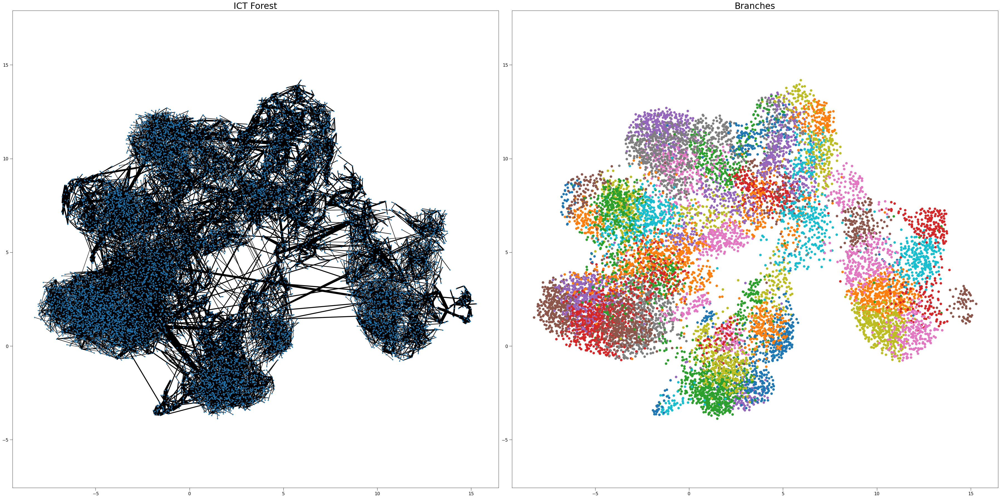

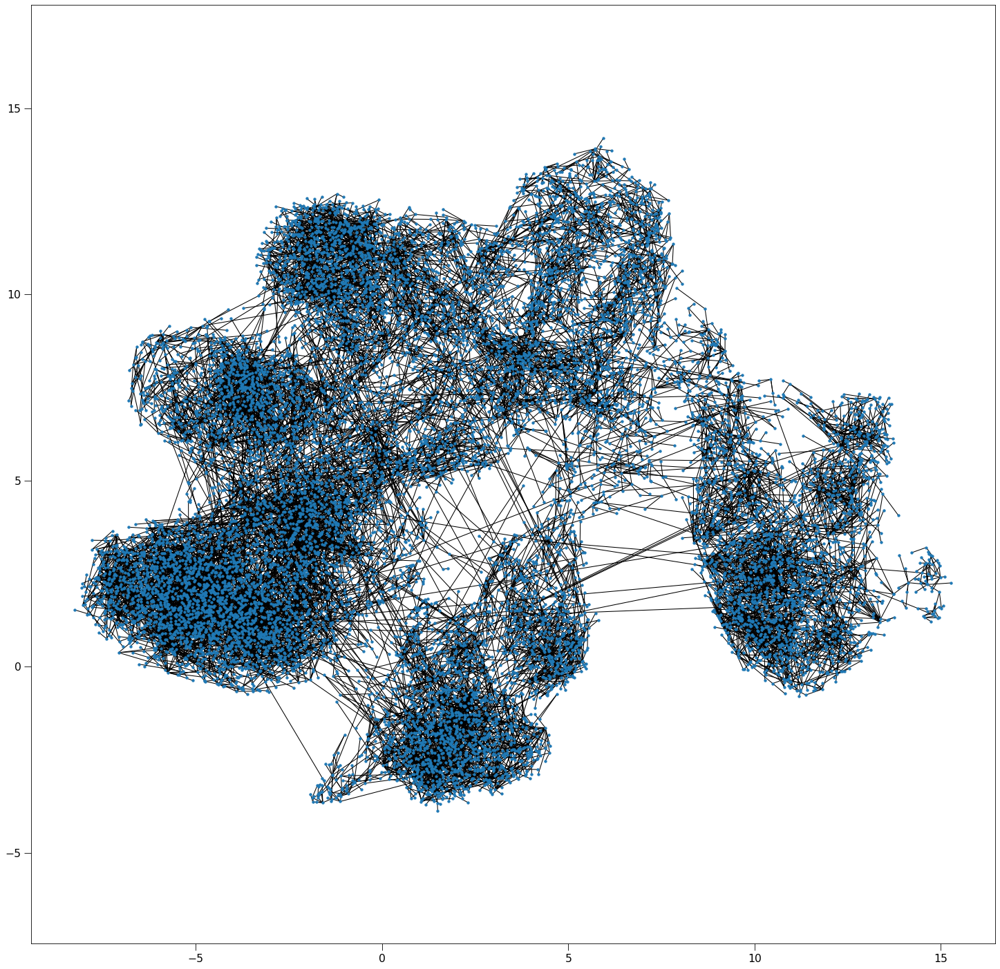

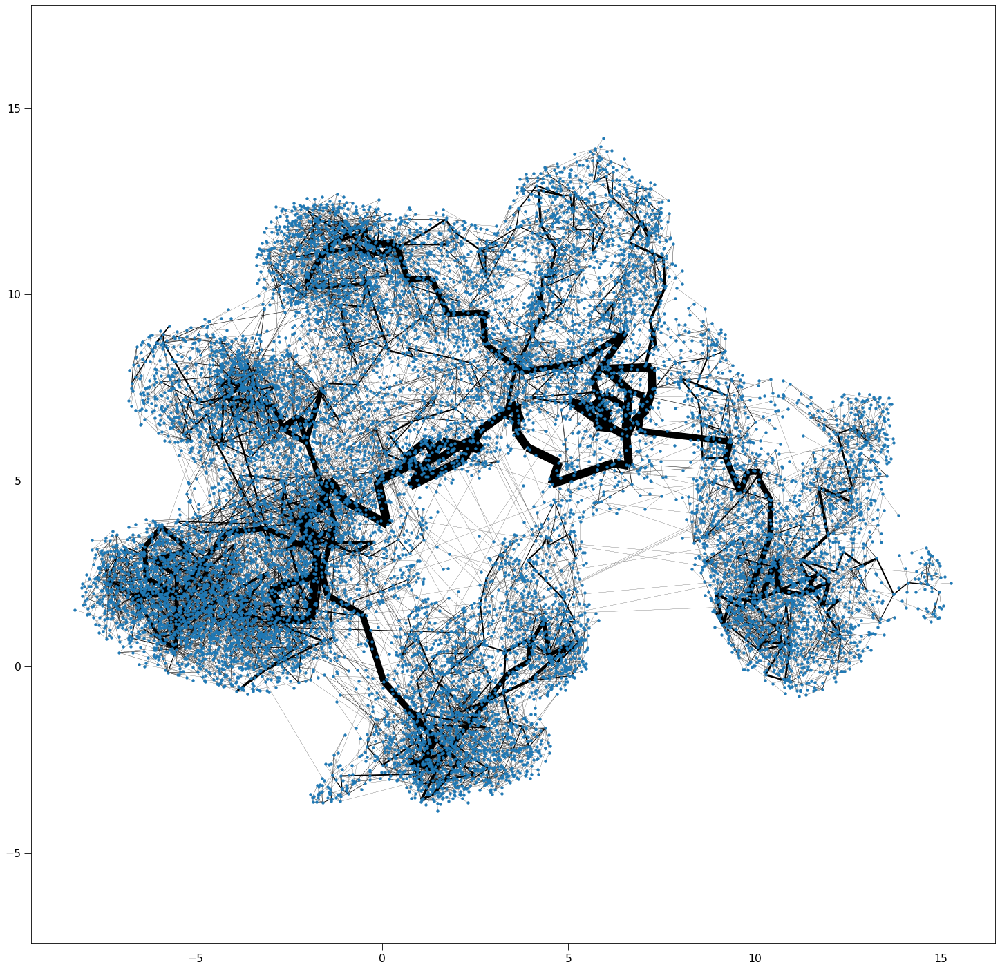

In [11]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [12]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()

create edgeId array:   0%|          | 0/13706 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/13706 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

update Arr 13706 -> 13706
added 8956 edges early
added 4749 edges early


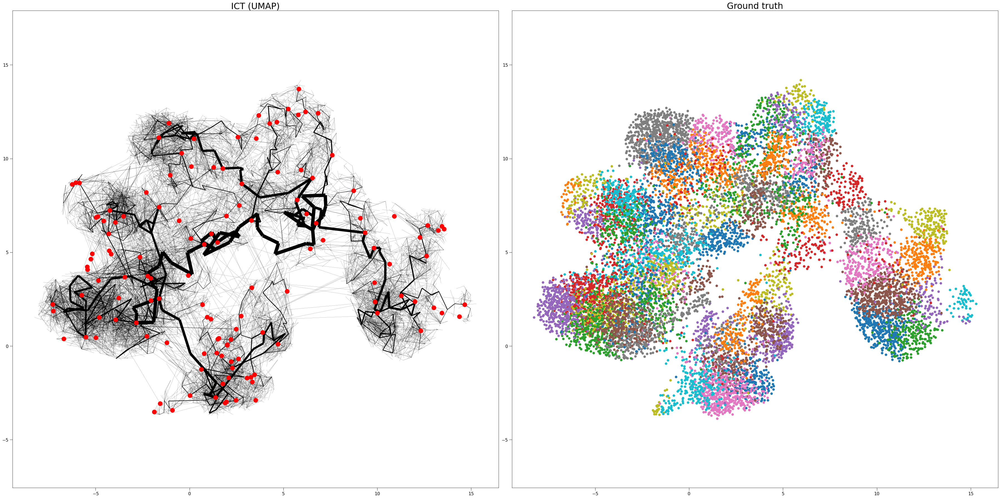

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

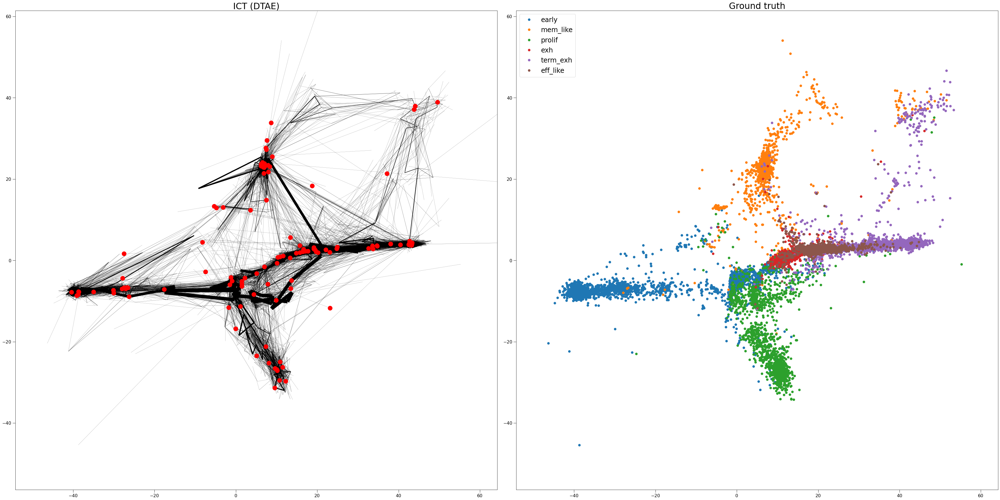

In [14]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

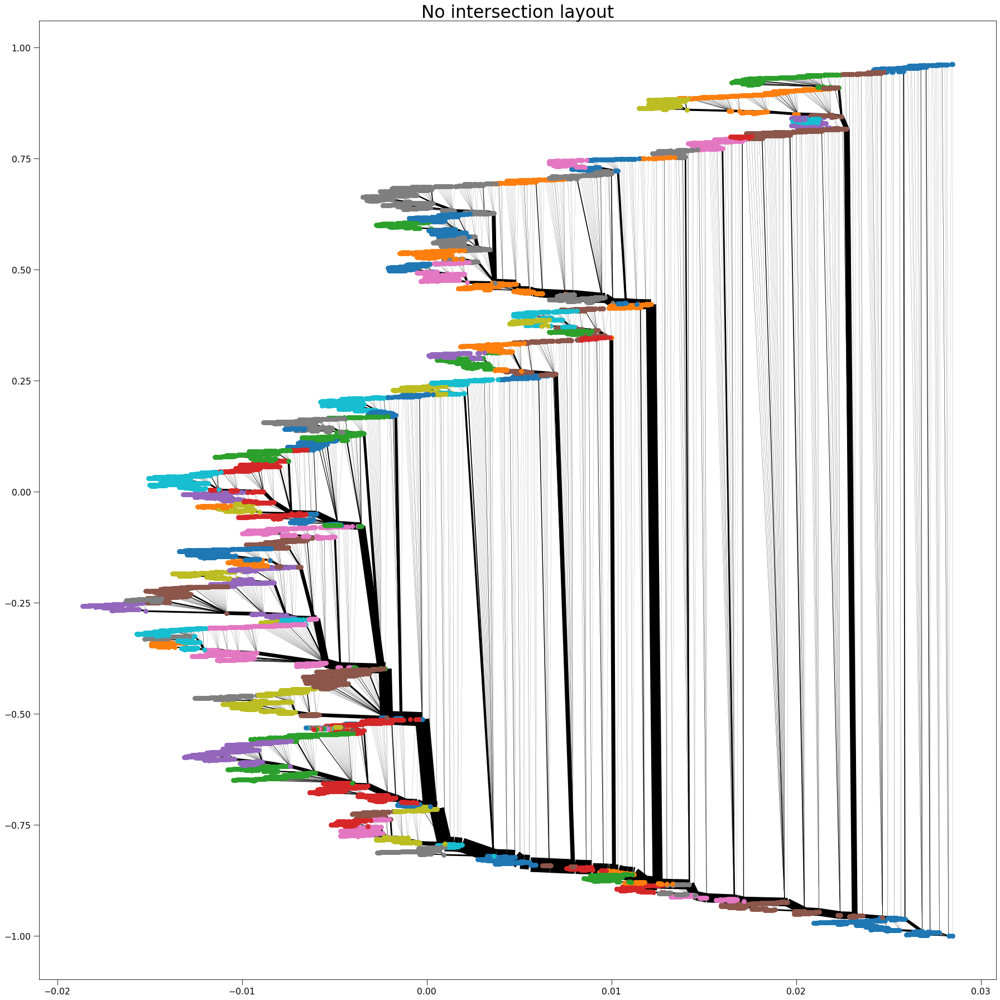

In [15]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()